### Laboratorium 7 - zadania

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

#### Zadanie 1 (1.0 pkt | 0.75 pkt)

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

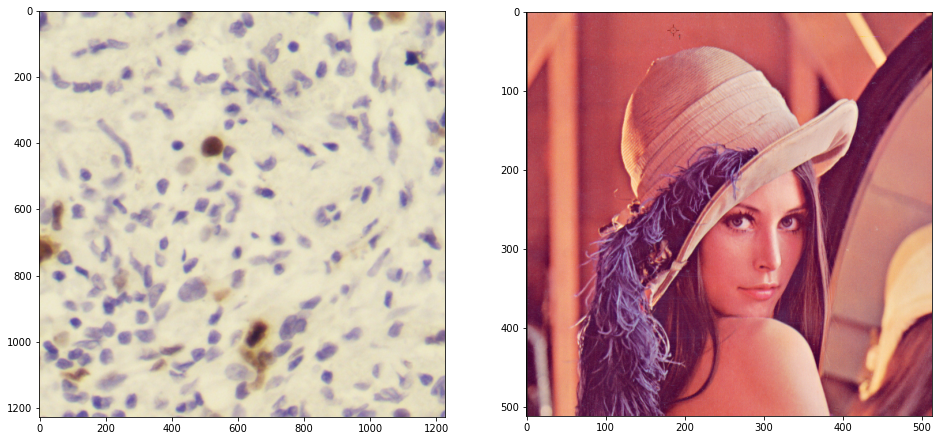

In [2]:
cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

In [3]:
from copy import deepcopy
# def zad1(lena_img, cells_img, ct = 0.04, et = 10):
#     sift = cv2.SIFT_create(contrastThreshold = ct, edgeThreshold=et) 
#     kp = sift.detect(lena_img)

#     # Marking the keypoint on the image using circles
#     img_rgb = cv2.cvtColor(lena_img, cv2.COLOR_BGR2RGB)
#     img = cv2.drawKeypoints(img_rgb,
#                             kp,
#                             img_rgb,
#                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#     sift = cv2.SIFT_create(contrastThreshold = ct, edgeThreshold=et) 
#     kp = sift.detect(cells_img)

#     # Marking the keypoint on the image using circles
#     img_rgb = cv2.cvtColor(cells_img, cv2.COLOR_BGR2RGB)
#     img2 = cv2.drawKeypoints(img_rgb,
#                             kp,
#                             img_rgb,
#                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#     fig, ax = plt.subplots(1,2,figsize=(20,10))
#     ax[0].imshow(img)
#     ax[1].imshow(img2)


def run_sift(img, ct = 0.04, et = 0.08):
    sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
    kp = sift.detect(img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out = cv2.drawKeypoints(img_rgb,
                    kp,
                    img_rgb,
                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return out
def zad1(img, color=-1):
    ct_vals = [0.02, 0.04, 0.08]
    et_vals = [5, 10, 20]
    
    fig, ax = plt.subplots(3,3, figsize=(15,15))
    
    for i, ct in enumerate(ct_vals):
        for j, et in enumerate(et_vals):
            img_cpy = deepcopy(img)
            sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
            kp = sift.detect(img_cpy)
            img_rgb = cv2.cvtColor(img_cpy, cv2.COLOR_BGR2RGB)
            out = cv2.drawKeypoints(img_rgb,
                            kp,
                            img_rgb,
                            color=color,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            ax[i][j].imshow(out)
            ax[i][j].set_title(f'ContrastThresh: {ct}  EdgeThresh: {et}', fontsize=16)
    plt.tight_layout()

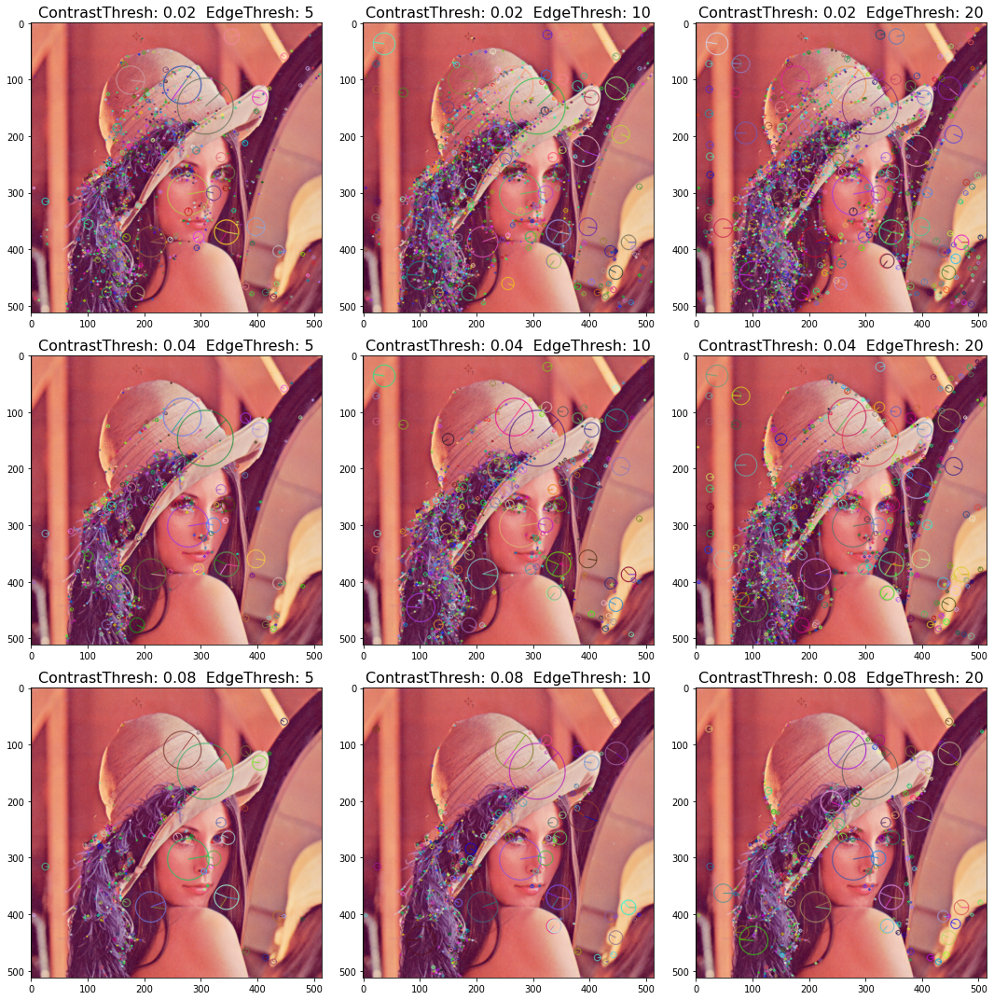

In [4]:
zad1(lena)
plt.savefig('zad1lena.png')

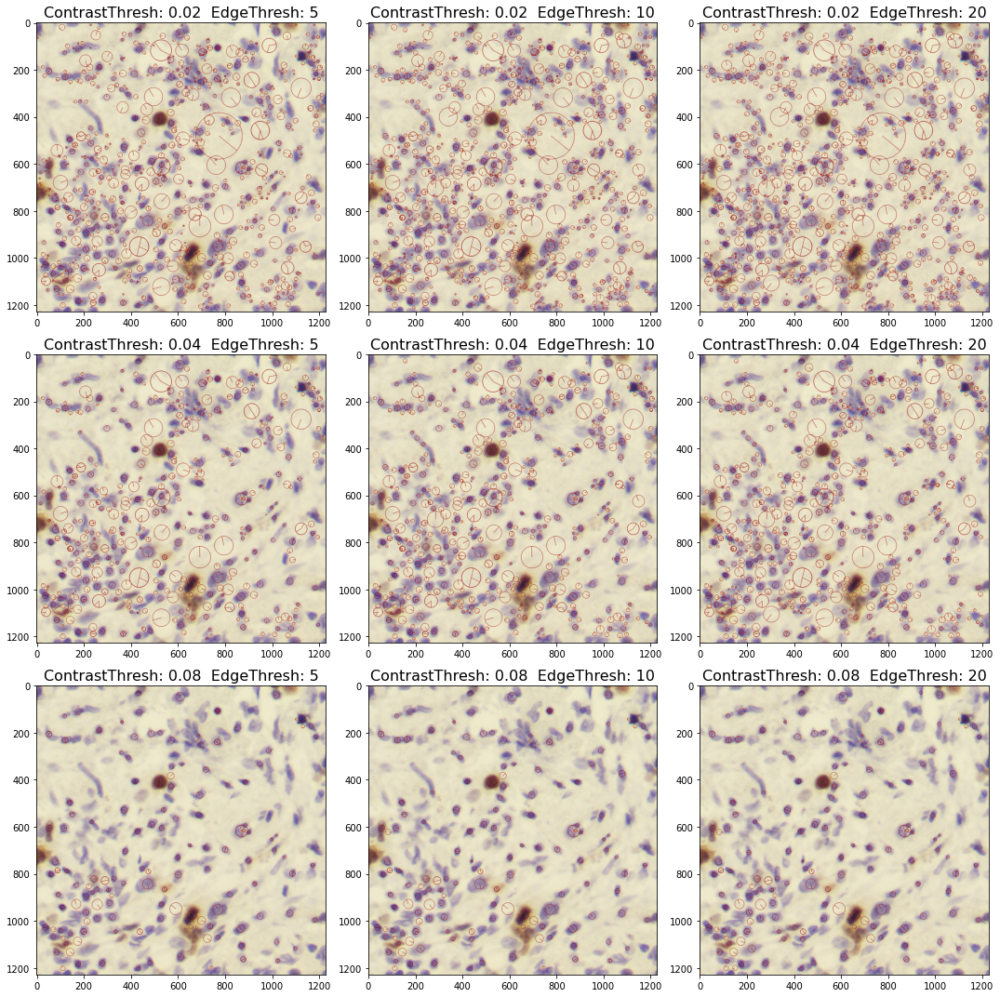

In [5]:
zad1(cells, 150)
plt.savefig('zad1cells.png')

#### Zadanie 2 (1.0 pkt | 0.75 pkt)

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [6]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

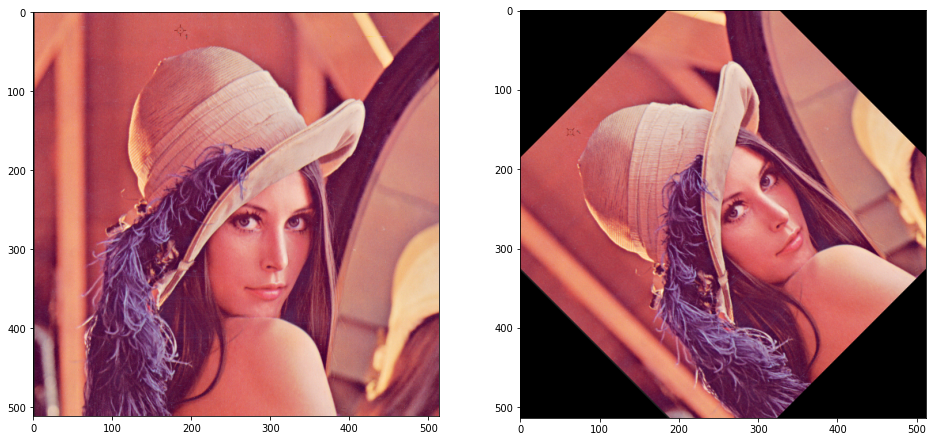

In [7]:
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

In [8]:
# i 0 -> 0 0 
# i 1 -> 0 1
# i 2 -> 0 2
# i 3 -> 1 0
# i 4 -> 1 1
# i 5 -> 1 2 

In [9]:
def zad2(img, ct=0.04, et=10, scale=0.9):
    
    fig, ax = plt.subplots(2,3, figsize=(15,10))
    for i, rotation in enumerate([0.0, 30.0, 60.0, 90.0, 120.0 ,150.0]):
        row = int(i >= 3)
        col = int(i % 3)
        img_cpy = deepcopy(img)
        img_cpy = rotate(img_cpy, rotation, scale=scale)
        sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
        kp = sift.detect(img_cpy)
        img_cpy2 = rotate(img_cpy, -rotation, 1/scale)
        img_rgb = cv2.cvtColor(img_cpy2, cv2.COLOR_BGR2RGB) 
        out = cv2.drawKeypoints(img_rgb,
                        kp,
                        img_rgb,
                        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        ax[row][col].imshow(out)
        ax[row][col].set_title(f'Rotation {rotation}')
        
        
def zad2v2(img, ct=0.08, et=10):
    rotations = [0.0, 30.0, 60.0, 90.0, 120.0]
    scales = [0.7, 0.9, 1.0, 1.2]
    
    fig, ax = plt.subplots(4, 5, figsize=(30,24))
    
    for i, scale in enumerate(scales):
        for j, rotation in enumerate(rotations):
            img_cpy = deepcopy(img)
            img_cpy = rotate(img_cpy, rotation, scale=scale)
            sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
            kp = sift.detect(img_cpy)
            img_cpy2 = rotate(img_cpy, -rotation, 1/scale)
            img_rgb = cv2.cvtColor(img_cpy2, cv2.COLOR_BGR2RGB) 
            out = cv2.drawKeypoints(img_rgb,
                            kp,
                            img_rgb,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            ax[i][j].imshow(out)
            ax[i][j].set_title(f'Rotation {rotation} Scale {scale}')

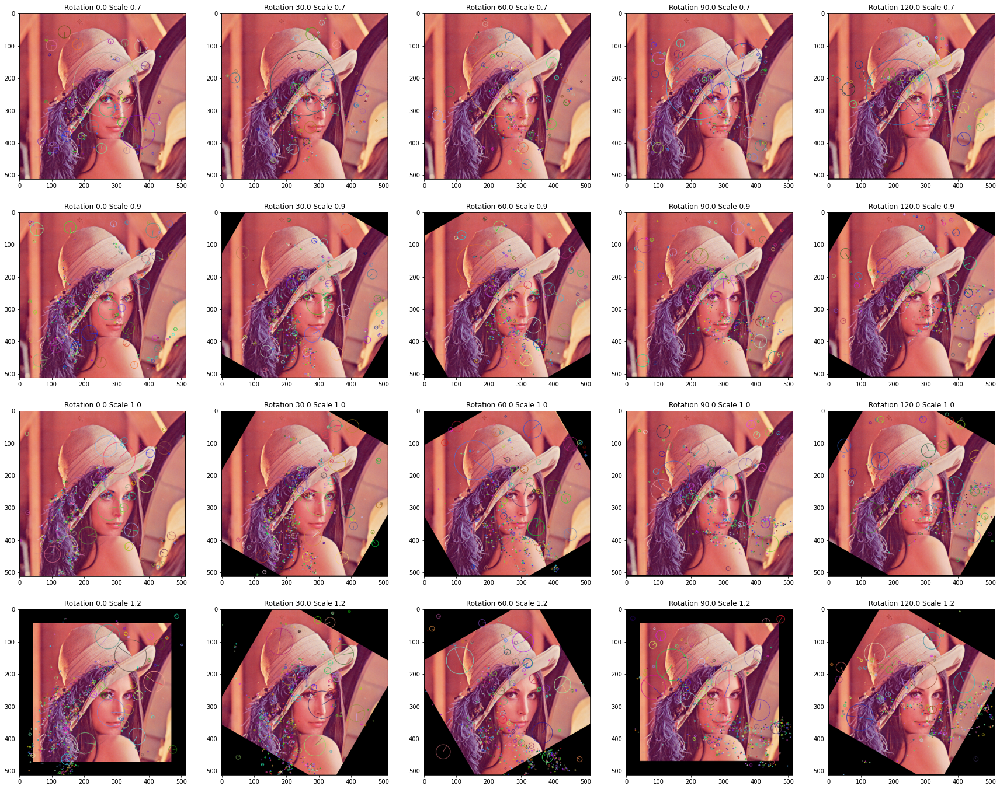

In [10]:
zad2v2(lena)
plt.savefig('zad2lena.png')

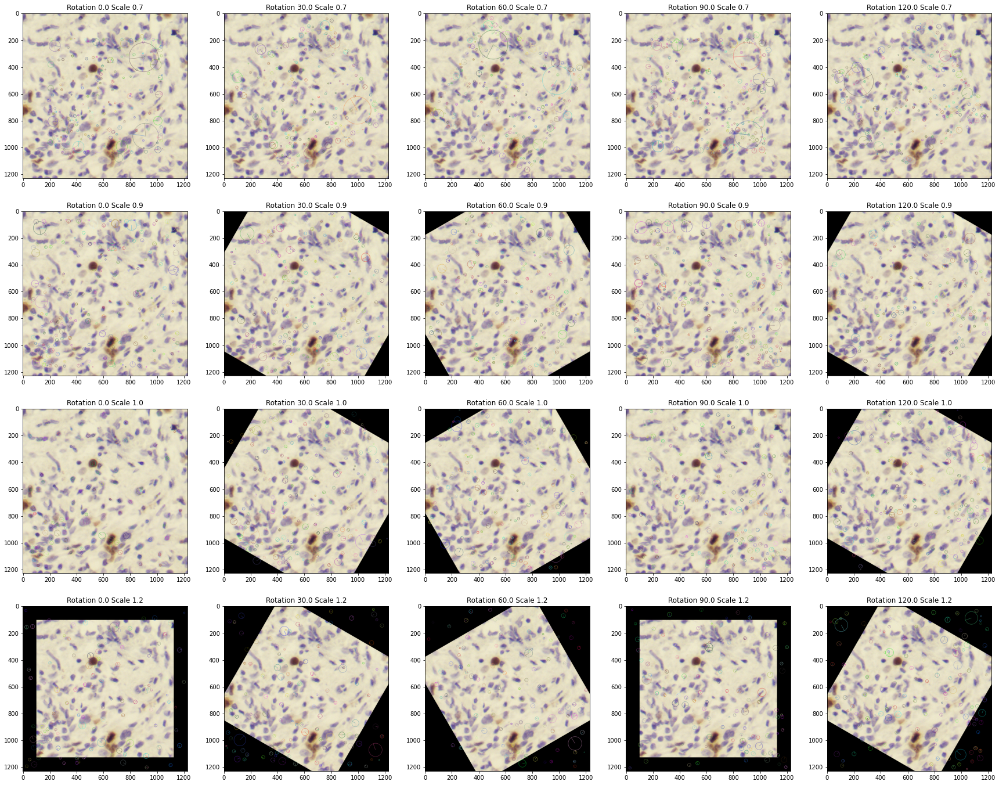

In [11]:
zad2v2(cells)
plt.savefig('zad2cells.png')

#### Zadanie 3 (1.0 pkt | 0.5 pkt)

Celem tego zadania jest wykrycie punktów zainteresowania odpowiadających jak najbardziej komórkom znajdującym się na obrazie `cells` (tło nie niesie informacji). Wykonaj detekcję SIFT z ustalonymi wcześniej parametrami; jaki problem dostrzegasz? Zaproponuj taki algorytm przetwarzania wstępnego dla tego obrazu, by wykrywać lepszej jakości punkty.  
Do zadania możesz podejść na dwa sposoby: albo modyfikując obraz źródłowy przed wykonaniem detekcji, albo opracowując maskę ograniczającą obszar detekcji.

_W sprawozdaniu postaraj się nie tylko opisać symptomy problemu i metodę rozwiązania go, ale zwrócić również uwagę na przyczyny wynikające z działania samego SIFT._

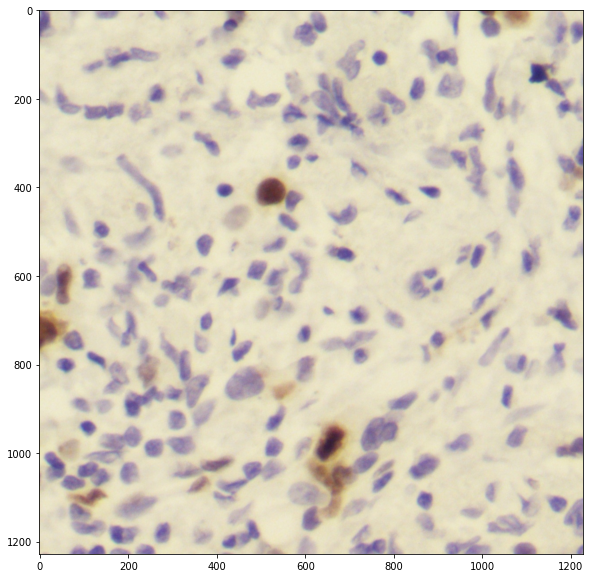

In [12]:
cells = cv2.imread('p1_0308_7.jpg')
f, ax = plt.subplots(1, 1, figsize=(10, 10)); ax.imshow(cells[..., ::-1]);

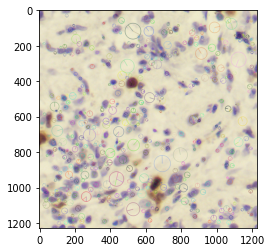

In [13]:
img = Image.fromarray(run_sift(cells))
plt.imshow(img)
plt.savefig('zad3v1.png')

In [14]:
def zad3(img, thresh_low=50, thresh_up=120):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    (T, img_thresh) = cv2.threshold(img_hsv[:,:,0], thresh_low, thresh_up, cv2.THRESH_BINARY)
    
    
    
    sift = cv2.SIFT_create()
    kp = sift.detect(img, img_thresh)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out = cv2.drawKeypoints(img_rgb,
                    kp,
                    img_rgb,
                    color=60,
                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    fig, ax = plt.subplots(1,3, figsize=(24,8))
    
    ax[0].imshow(img_hsv[:,:,0],cmap='gray')
    ax[0].set_title('HSV - channel H')
    ax[1].imshow(img_thresh, cmap='gray')
    ax[1].set_title('Binarized - mask')
    ax[2].imshow(out)
    ax[2].set_title('SIFT')
    
    
    return out

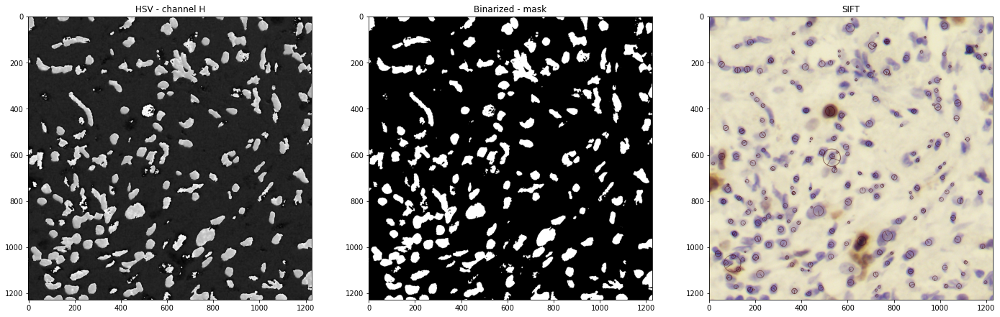

In [15]:
sifted_cells = zad3(cells)
plt.savefig('zad3v2.png')

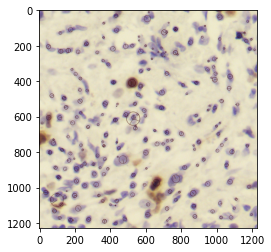

In [18]:
sift_end = Image.fromarray(sifted_cells)
plt.imshow(sift_end)
plt.savefig('zad3v3.png')

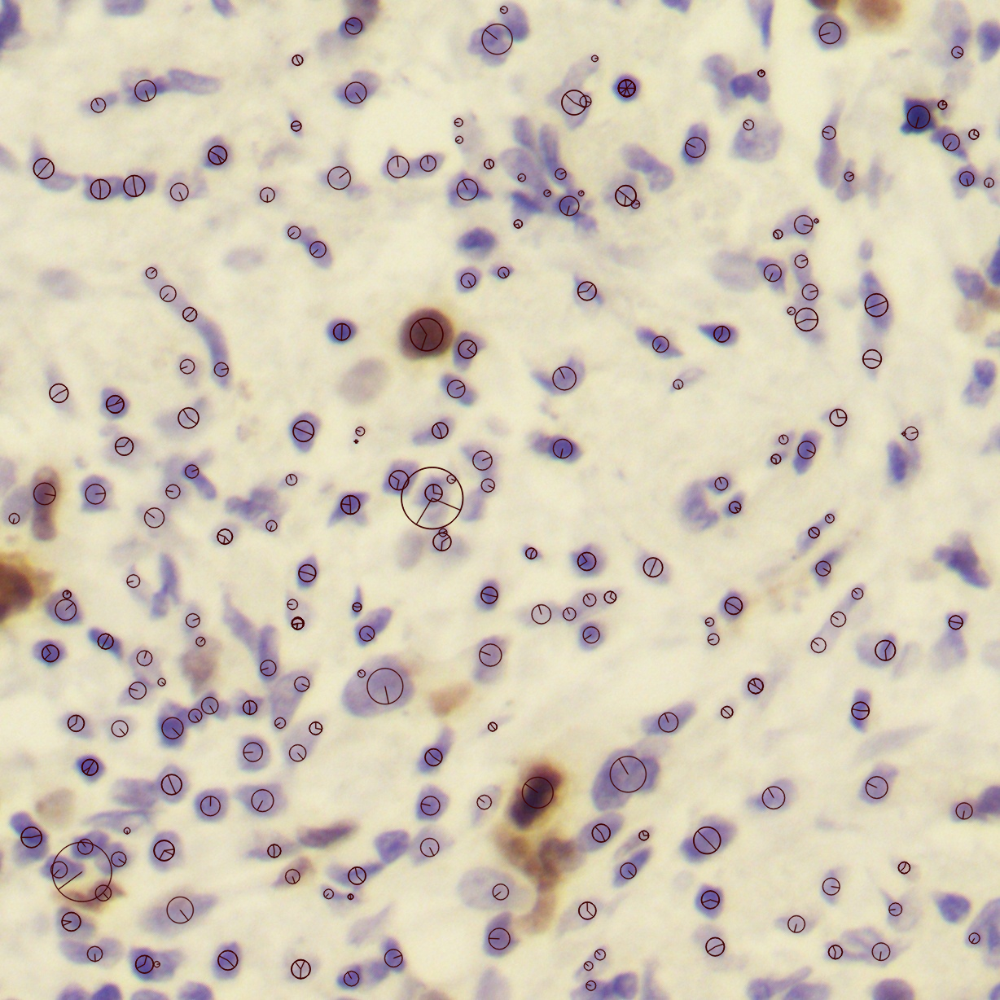

In [19]:
Image.fromarray(sifted_cells)

In [20]:
Image.fromarray(sifted_cells).save("zad3v3.png", "PNG")